# Import basic libraries

In [1]:
import numpy as np #for doing efficient computations
import pandas as pd #for reading and writing spreadsheets
#data visualization
import plotly
import plotly.express as px
import plotly.graph_objects as go

# Import FIFA 21 dataset

In [2]:
df_21 = pd.read_csv('/Users/alexitzu23/Downloads/archive/players_21.csv')
df_21.head() #showing the top 5 players in FIFA 21 by overall rating

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club_name,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,33,1987-06-24,170,72,Argentina,FC Barcelona,...,66+3,65+3,65+3,65+3,66+3,62+3,52+3,52+3,52+3,62+3
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,35,1985-02-05,187,83,Portugal,Juventus,...,65+3,61+3,61+3,61+3,65+3,61+3,54+3,54+3,54+3,61+3
2,200389,https://sofifa.com/player/200389/jan-oblak/210002,J. Oblak,Jan Oblak,27,1993-01-07,188,87,Slovenia,Atlético Madrid,...,32+3,36+3,36+3,36+3,32+3,32+3,33+3,33+3,33+3,32+3
3,188545,https://sofifa.com/player/188545/robert-lewand...,R. Lewandowski,Robert Lewandowski,31,1988-08-21,184,80,Poland,FC Bayern München,...,64+3,65+3,65+3,65+3,64+3,61+3,60+3,60+3,60+3,61+3
4,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Júnior,28,1992-02-05,175,68,Brazil,Paris Saint-Germain,...,67+3,62+3,62+3,62+3,67+3,62+3,49+3,49+3,49+3,62+3


# Extracting only the useful columns

In [3]:
df_21.shape #to check the number of rows and columns

(18944, 106)

In [4]:
col = list(df_21.columns)  #to print all the columns
print(col)

['sofifa_id', 'player_url', 'short_name', 'long_name', 'age', 'dob', 'height_cm', 'weight_kg', 'nationality', 'club_name', 'league_name', 'league_rank', 'overall', 'potential', 'value_eur', 'wage_eur', 'player_positions', 'preferred_foot', 'international_reputation', 'weak_foot', 'skill_moves', 'work_rate', 'body_type', 'real_face', 'release_clause_eur', 'player_tags', 'team_position', 'team_jersey_number', 'loaned_from', 'joined', 'contract_valid_until', 'nation_position', 'nation_jersey_number', 'pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic', 'gk_diving', 'gk_handling', 'gk_kicking', 'gk_reflexes', 'gk_speed', 'gk_positioning', 'player_traits', 'attacking_crossing', 'attacking_finishing', 'attacking_heading_accuracy', 'attacking_short_passing', 'attacking_volleys', 'skill_dribbling', 'skill_curve', 'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control', 'movement_acceleration', 'movement_sprint_speed', 'movement_agility', 'movement_reactions', 'movement_ba

In [5]:
useless_columns = ['dob','sofifa_id','player_url','long_name','body_type','real_face','nation_position','loaned_from','nation_jersey_number']
df_21 = df_21.drop(useless_columns, axis = 1)

In [6]:
df_21.shape #to check how many columns did we dropped

(18944, 97)

In [7]:
df_21['BMI'] = df_21['weight_kg'] / (df_21['height_cm'] / 100) ** 2
df_21.head()

,short_name,age,height_cm,weight_kg,nationality,club_name,league_name,league_rank,overall,potential,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,BMI
0,L. Messi,33,170,72,Argentina,FC Barcelona,Spain Primera Division,1.0,93,93,...,65+3,65+3,65+3,66+3,62+3,52+3,52+3,52+3,62+3,24.913495
1,Cristiano Ronaldo,35,187,83,Portugal,Juventus,Italian Serie A,1.0,92,92,...,61+3,61+3,61+3,65+3,61+3,54+3,54+3,54+3,61+3,23.735308
2,J. Oblak,27,188,87,Slovenia,Atlético Madrid,Spain Primera Division,1.0,91,93,...,36+3,36+3,36+3,32+3,32+3,33+3,33+3,33+3,32+3,24.615211
3,R. Lewandowski,31,184,80,Poland,FC Bayern München,German 1. Bundesliga,1.0,91,91,...,65+3,65+3,65+3,64+3,61+3,60+3,60+3,60+3,61+3,23.629490
4,Neymar Jr,28,175,68,Brazil,Paris Saint-Germain,French Ligue 1,1.0,91,91,...,62+3,62+3,62+3,67+3,62+3,49+3,49+3,49+3,62+3,22.204082


# Data Cleaning

In [8]:
df_21[['short_name','player_positions']]

,short_name,player_positions
0,L. Messi,"RW, ST, CF"
1,Cristiano Ronaldo,"ST, LW"
2,J. Oblak,GK
3,R. Lewandowski,ST
4,Neymar Jr,"LW, CAM"
...,...,...
18939,K. Angulo,CM
18940,Zhang Mengxuan,CB
18941,Wang Zhenghao,CB
18942,Chen Zitong,CM


In [9]:
#rewrite the previous table
new_player_position = df_21['player_positions'].str.get_dummies(sep=',').add_prefix('Position')
new_player_position.head()

,Position CAM,Position CB,Position CDM,Position CF,Position CM,Position LB,Position LM,Position LW,Position LWB,Position RB,...,PositionGK,PositionLB,PositionLM,PositionLW,PositionLWB,PositionRB,PositionRM,PositionRW,PositionRWB,PositionST
0,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
1,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1
2,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,1,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0


In [10]:
df_21 =  pd.concat([df_21,new_player_position],axis = 1)
df_21 =  df_21.drop('player_positions',axis=1)
columns = ['ls','st','rs','lw','lf','cf','rf','rw','lam','cam','ram','lm','lcm','cm',
           'rcm','rm','lwb','ldm', 'cdm','rdm','rwb','lb','lcb','cb','rcb','rb']
df_21[columns].head()

,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,89+3,89+3,89+3,92+0,93+0,93+0,93+0,92+0,93+0,93+0,...,66+3,65+3,65+3,65+3,66+3,62+3,52+3,52+3,52+3,62+3
1,91+1,91+1,91+1,89+0,91+0,91+0,91+0,89+0,88+3,88+3,...,65+3,61+3,61+3,61+3,65+3,61+3,54+3,54+3,54+3,61+3
2,33+3,33+3,33+3,32+0,35+0,35+0,35+0,32+0,38+3,38+3,...,32+3,36+3,36+3,36+3,32+3,32+3,33+3,33+3,33+3,32+3
3,89+2,89+2,89+2,85+0,87+0,87+0,87+0,85+0,85+3,85+3,...,64+3,65+3,65+3,65+3,64+3,61+3,60+3,60+3,60+3,61+3
4,84+3,84+3,84+3,90+0,89+0,89+0,89+0,90+0,90+1,90+1,...,67+3,62+3,62+3,62+3,67+3,62+3,49+3,49+3,49+3,62+3


In [11]:
#remove the '+' sign
for col in columns:
  df_21[col]=df_21[col].str.split('+',n=1,expand = True)[0]
df_21[columns]

,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,89,89,89,92,93,93,93,92,93,93,...,66,65,65,65,66,62,52,52,52,62
1,91,91,91,89,91,91,91,89,88,88,...,65,61,61,61,65,61,54,54,54,61
2,33,33,33,32,35,35,35,32,38,38,...,32,36,36,36,32,32,33,33,33,32
3,89,89,89,85,87,87,87,85,85,85,...,64,65,65,65,64,61,60,60,60,61
4,84,84,84,90,89,89,89,90,90,90,...,67,62,62,62,67,62,49,49,49,62
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18939,44,44,44,47,45,45,45,47,47,47,...,47,47,47,47,47,47,46,46,46,47
18940,32,32,32,30,30,30,30,30,29,29,...,42,41,41,41,42,45,47,47,47,45
18941,34,34,34,33,33,33,33,33,33,33,...,42,42,42,42,42,44,47,47,47,44
18942,44,44,44,46,45,45,45,46,47,47,...,47,49,49,49,47,47,49,49,49,47


In [12]:
columns = ['dribbling','defending','physic','passing','shooting','pace']
df_21[columns]

,dribbling,defending,physic,passing,shooting,pace
0,95.0,38.0,65.0,91.0,92.0,85.0
1,89.0,35.0,77.0,81.0,93.0,89.0
2,NaN,NaN,NaN,NaN,NaN,NaN
3,85.0,43.0,82.0,78.0,91.0,78.0
4,94.0,36.0,59.0,86.0,85.0,91.0
...,...,...,...,...,...,...
18939,47.0,41.0,50.0,50.0,37.0,63.0
18940,27.0,50.0,48.0,26.0,23.0,58.0
18941,36.0,45.0,55.0,29.0,25.0,51.0
18942,48.0,44.0,58.0,48.0,35.0,61.0


In [13]:
df_21[columns] = df_21[columns].fillna(0) #fill NaN values
df_21[columns] = df_21[columns].astype(int) #convert to integer
df_21[columns]

,dribbling,defending,physic,passing,shooting,pace
0,95,38,65,91,92,85
1,89,35,77,81,93,89
2,0,0,0,0,0,0
3,85,43,82,78,91,78
4,94,36,59,86,85,91
...,...,...,...,...,...,...
18939,47,41,50,50,37,63
18940,27,50,48,26,23,58
18941,36,45,55,29,25,51
18942,48,44,58,48,35,61


In [14]:
df_21[columns].isnull().sum() #check how many null values exist 

dribbling    0
defending    0
physic       0
passing      0
shooting     0
pace         0
dtype: int64

In [15]:
df_21 = df_21.fillna(0)
df_21.isnull().sum()

short_name     0
age            0
height_cm      0
weight_kg      0
nationality    0
              ..
PositionRB     0
PositionRM     0
PositionRW     0
PositionRWB    0
PositionST     0
Length: 126, dtype: int64

In [16]:
#there does not exist null values anymore

# Data visualization
## Scatter plots

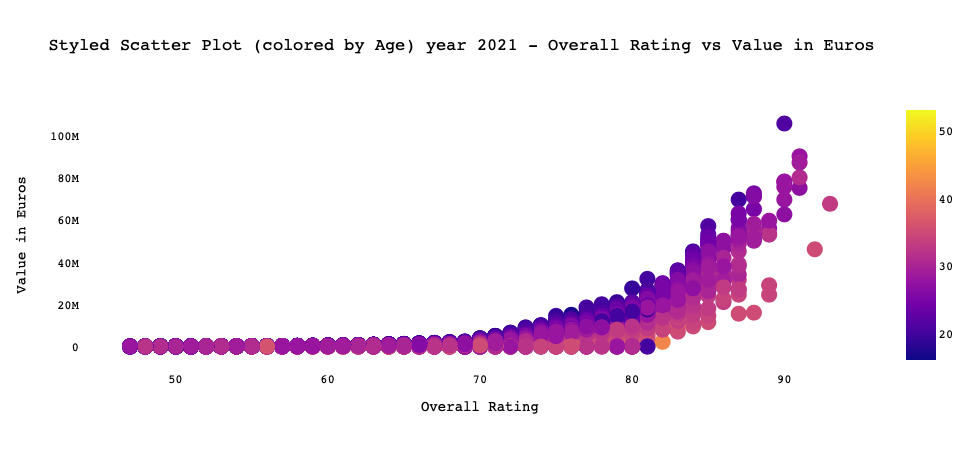

In [17]:
fig = go.Figure()

fig = go.Figure(data=go.Scatter(
    x = df_21['overall'],
    y = df_21['value_eur'],
    mode='markers',
    marker=dict(
        size=16,
        color=df_21['age'], #set color equal to a variable
        colorscale='Plasma', # one of plotly colorscales
        showscale=True
    ),
    text= df_21['short_name'],
))

fig.update_layout(title='Styled Scatter Plot (colored by Age) year 2021 - Overall Rating vs Value in Euros',
                  xaxis_title='Overall Rating',
                  yaxis_title='Value in Euros',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  font=dict(family='Cambria, monospace', size=12, color='#000000'))
fig.show()

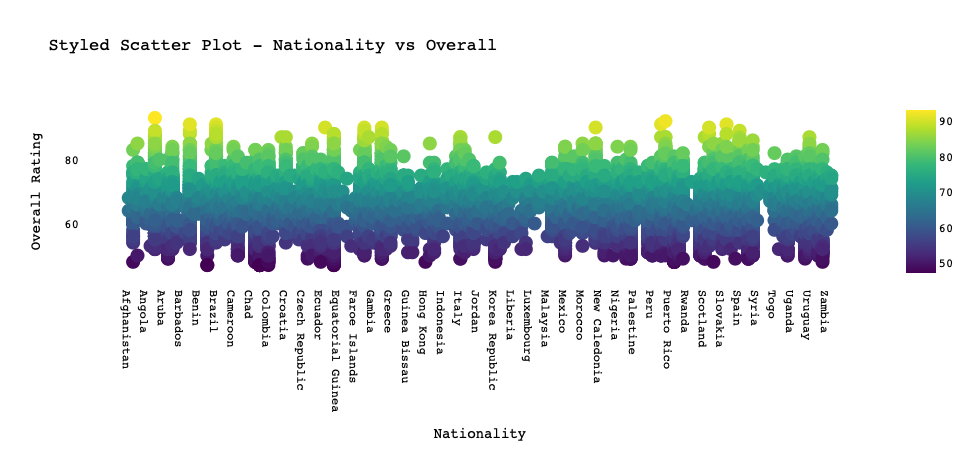

In [18]:
fig = go.Figure()
sample = df_21.sort_values(by='nationality')
fig = go.Figure(data=go.Scatter(
    x = sample['nationality'],
    y = sample['overall'],
    mode='markers',
    marker=dict(
        size=14,
        color=sample['overall'], #set color equal to a variable
        colorscale='Viridis', # one of plotly colorscales
        showscale=True
    ),
    text= sample['short_name']
))

fig.update_layout(title='Styled Scatter Plot - Nationality vs Overall',
                  xaxis_title='Nationality',
                  yaxis_title='Overall Rating',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  font=dict(family='Cambria, monospace', size=12, color='#000000')
                 )
fig.show()

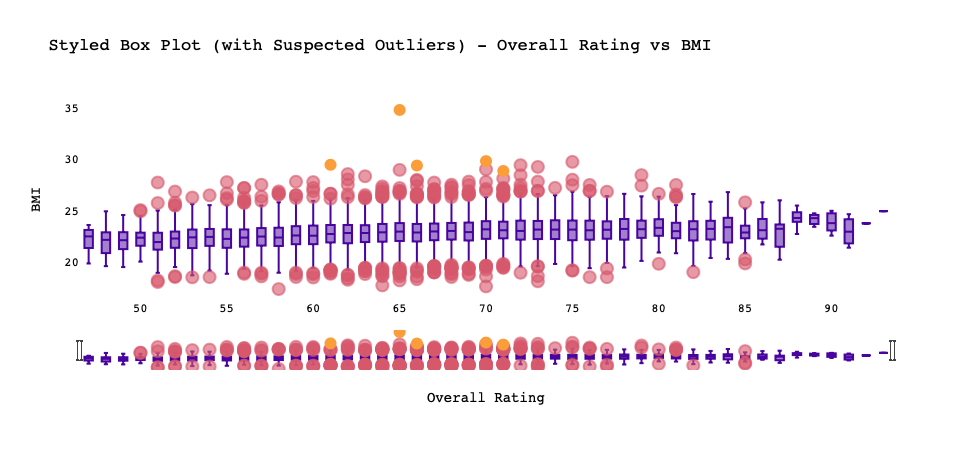

In [19]:
fig = go.Figure()
sample = df_21.sort_values(by='overall')

fig.add_trace(go.Box(
    x = sample['overall'],
    y = sample['BMI'],
    name="Suspected Outliers",
    boxpoints='suspectedoutliers', # only suspected outliers
    marker=dict(
        size=12,
        color='rgb(251, 158, 58)',
        outliercolor='rgba(216, 87, 107, 0.6)',
        line=dict(
            outliercolor='rgba(216, 87, 107, 0.6)',
            outlierwidth=2)),
    line_color='rgb(73, 3, 159)',
    text= sample['short_name']
))

fig.update_layout(title='Styled Box Plot (with Suspected Outliers) - Overall Rating vs BMI',
                  xaxis_title='Overall Rating',
                  yaxis_title='BMI',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  font=dict(family='Cambria, monospace', size=12, color='#000000'),
                  xaxis_rangeslider_visible=True)
fig.show()

## The attributes of Messi and Ronaldo in the last 5 years

In [20]:
df_20 = pd.read_csv('/Users/alexitzu23/Downloads/archive/players_20.csv')
df_19 = pd.read_csv('/Users/alexitzu23/Downloads/archive/players_19.csv')
df_18 = pd.read_csv('/Users/alexitzu23/Downloads/archive/players_18.csv')
df_17 = pd.read_csv('/Users/alexitzu23/Downloads/archive/players_17.csv')

In [21]:
import re
# Creating a method to compare a Players growth over Time
def playergrowth(x):
    a = df_21[df_21.short_name.str.startswith(x)]
    b = df_20[df_20.short_name.str.startswith(x)]
    c = df_19[df_19.short_name.str.startswith(x)]
    d = df_18[df_18.short_name.str.startswith(x)]
    e = df_17[df_17.short_name.str.startswith(x)]
    
    trace0 = go.Scatterpolar(
      r = [a['pace'].values[0],a['shooting'].values[0],a['passing'].values[0],a['dribbling'].values[0],a['defending'].values[0],a['physic'].values[0],a["overall"].values[0]],
      theta = ['Pace','Shooting','Passing','Dribbling','Defending','Physic','Overall'],
      fill = 'toself',
      name = '2021'
    )

    trace1 = go.Scatterpolar(
      r = [b['pace'].values[0],b['shooting'].values[0],b['passing'].values[0],b['dribbling'].values[0],b['defending'].values[0],b['physic'].values[0],b["overall"].values[0]],
      theta = ['Pace','Shooting','Passing','Dribbling','Defending','Physic','Overall'],
      fill = 'toself',
      name = '2020'
    )
    
    trace2 = go.Scatterpolar(
      r = [c['pace'].values[0],c['shooting'].values[0],c['passing'].values[0],c['dribbling'].values[0],c['defending'].values[0],c['physic'].values[0],c["overall"].values[0]],
      theta = ['Pace','Shooting','Passing','Dribbling','Defending','Physic','Overall'],
      fill = 'toself',
      name = '2019'
    )
    
    trace3 = go.Scatterpolar(
      r = [d['pace'].values[0],d['shooting'].values[0],d['passing'].values[0],d['dribbling'].values[0],d['defending'].values[0],d['physic'].values[0],d["overall"].values[0]],
      theta = ['Pace','Shooting','Passing','Dribbling','Defending','Physic','Overall'],
      fill = 'toself',
      name = '2018'
    )
    
    trace4 = go.Scatterpolar(
      r = [e['pace'].values[0],e['shooting'].values[0],e['passing'].values[0],e['dribbling'].values[0],e['defending'].values[0],e['physic'].values[0],e["overall"].values[0]],
      theta = ['Pace','Shooting','Passing','Dribbling','Defending','Physic','Overall'],
      fill = 'toself',
      name = '2017'
    )
    
    data = [trace0, trace1, trace2, trace3, trace4]

    layout = go.Layout(
      polar = dict(
        radialaxis = dict(
          visible = True,
          range = [0, 100]
        )
      ),
      template="plotly_white",  
      showlegend = True,
      font=dict(family='Cambria, monospace', size=12, color='#000000'),
      title = "Stats: {} from 2017 to 2021".format(a.short_name.values[0])
        
    )
    fig = go.Figure(data=data, layout=layout)
    plotly.offline.iplot(fig, filename = "Player stats")

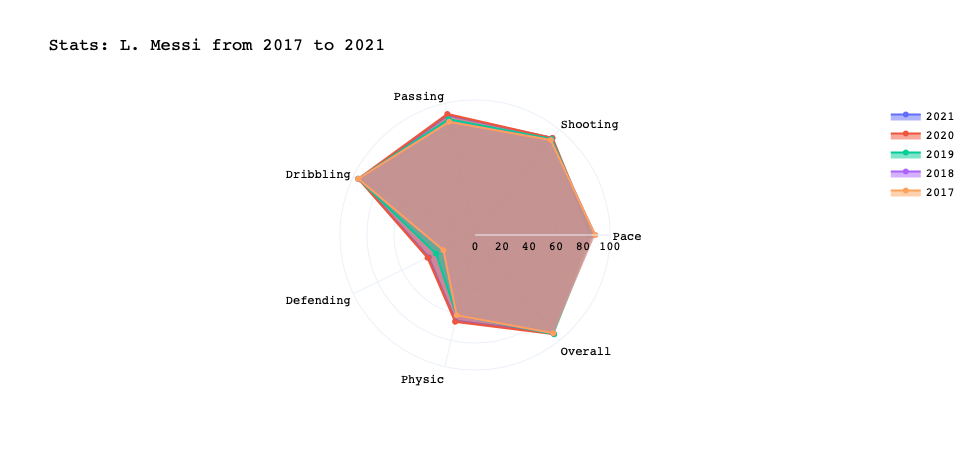

In [22]:
playergrowth ("L. Messi")

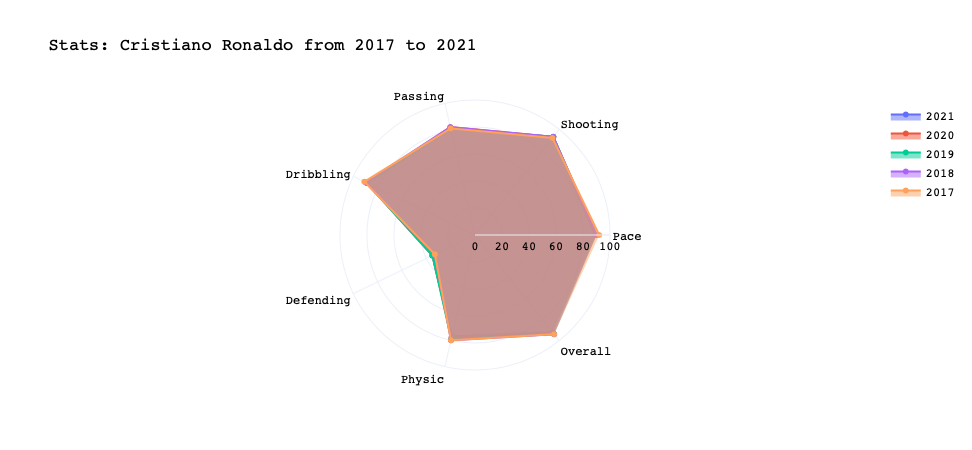

In [23]:
playergrowth ("Cristiano Ronaldo")

We cannot see big changes, which proves the maintenance of them at a very high level for so a long time

# Pick top 5 players per position in the given budget

In [24]:
# Creating a method to compare 5 Players
def top5(ls_name, column, value):
    x = df_21[df_21["short_name"] == ls_name[0]]
    y = df_21[df_21["short_name"] == ls_name[1]]
    z = df_21[df_21["short_name"] == ls_name[2]]
    az = df_21[df_21["short_name"] == ls_name[3]]
    bz = df_21[df_21["short_name"] == ls_name[4]]

    
    trace0 = go.Scatterpolar(
      r = [x['pace'].values[0],x['shooting'].values[0],x['passing'].values[0],x['dribbling'].values[0],x['defending'].values[0],x['physic'].values[0],x["overall"].values[0]],
      theta = ['Pace','Shooting','Passing','Dribbling','Defending','Physic','Overall'],
      fill = 'toself',
      name = x.short_name.values[0]
    )

    trace1 = go.Scatterpolar(
      r = [y['pace'].values[0],y['shooting'].values[0],y['passing'].values[0],y['dribbling'].values[0],y['defending'].values[0],y['physic'].values[0],y["overall"].values[0]],
      theta = ['Pace','Shooting','Passing','Dribbling','Defending','Physic','Overall'],
      fill = 'toself',
      name = y.short_name.values[0]
    )
    
    trace2 = go.Scatterpolar(
      r = [z['pace'].values[0],z['shooting'].values[0],z['passing'].values[0],z['dribbling'].values[0],z['defending'].values[0],z['physic'].values[0],z["overall"].values[0]],
      theta = ['Pace','Shooting','Passing','Dribbling','Defending','Physic','Overall'],
      fill = 'toself',
      name = z.short_name.values[0]
    )
    
    trace3 = go.Scatterpolar(
      r = [az['pace'].values[0],az['shooting'].values[0],az['passing'].values[0],az['dribbling'].values[0],az['defending'].values[0],az['physic'].values[0],az["overall"].values[0]],
      theta = ['Pace','Shooting','Passing','Dribbling','Defending','Physic','Overall'],
      fill = 'toself',
      name = az.short_name.values[0]
    )
    
    trace4 = go.Scatterpolar(
      r = [bz['pace'].values[0],bz['shooting'].values[0],bz['passing'].values[0],bz['dribbling'].values[0],bz['defending'].values[0],bz['physic'].values[0],bz["overall"].values[0]],
      theta = ['Pace','Shooting','Passing','Dribbling','Defending','Physic','Overall'],
      fill = 'toself',
      name = bz.short_name.values[0]
    )
    
    
    data = [trace0, trace1, trace2, trace3, trace4]

    layout = go.Layout(
      polar = dict(
        radialaxis = dict(
          visible = True,
          range = [0, 100]
        )
      ),
      template="plotly_white",  
      showlegend = True,
      font=dict(family='Cambria, monospace', size=12, color='#000000'),
      title = "{} stats comparison for top 5 under €{}".format(column, value, x.short_name.values[0], y.short_name.values[0], z.short_name.values[0], az.short_name.values[0], bz.short_name.values[0] )
        
    )
    fig = go.Figure(data=data, layout=layout)
    plotly.offline.iplot(fig, filename = "Player stats")
    return None

# Creating a method to pick top 5 player in position
def position(pos, value):
    column = str('Position')+str.upper(pos)
    print("You've Entered Position: ",column)
    print("You've Entered Value €: ", value)
    ls_name = df_21[(df_21[column]==1) & (df_21['value_eur']<=value)]['short_name'].head(5).values
    print(ls_name)
    top5(ls_name, column, value)
    return None

You've Entered Position:  PositionCAM
You've Entered Value €:  35000000
['A. Gómez' 'David Silva' 'M. Reus' 'Isco' 'D. Alli']


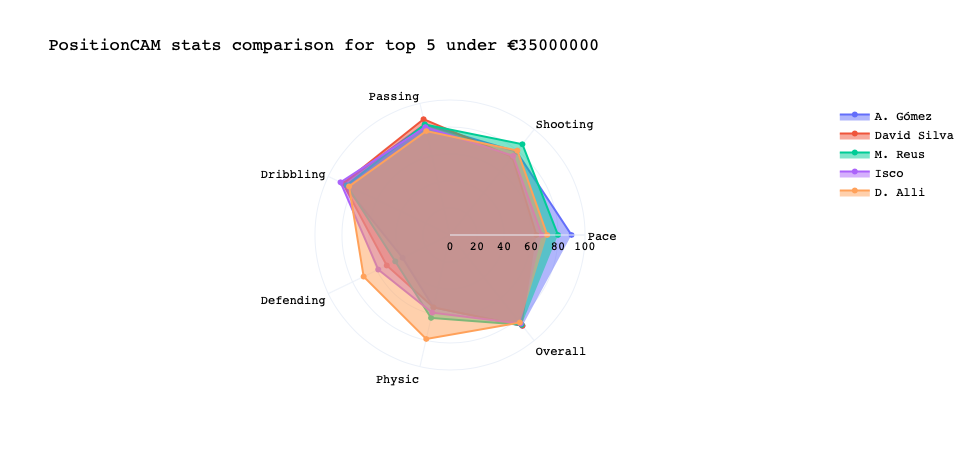

In [25]:
position('cam', 35000000)

## Top 50 FIFA 21 players filtered by club and nation

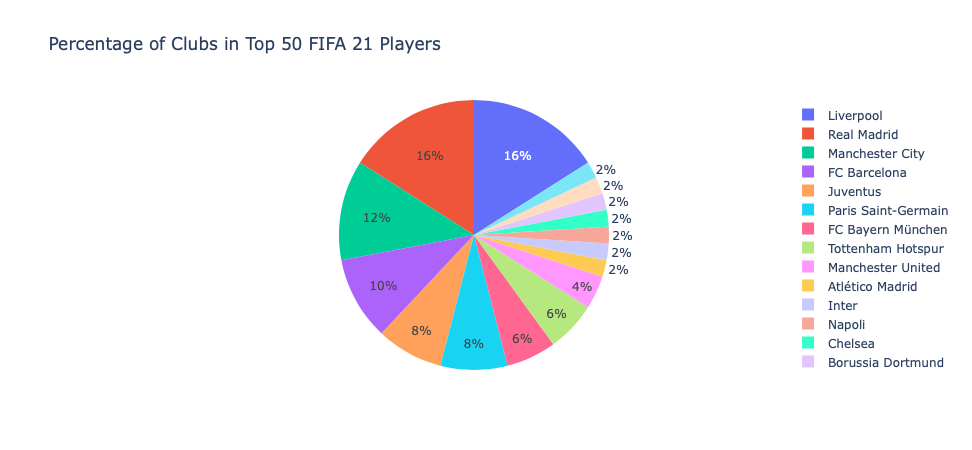

In [26]:
fig = px.pie(df_21.head(50),names='club_name',title='Percentage of Clubs in Top 50 FIFA 21 Players')
fig.show()

In [ ]:
fig = px.pie(df_21.head(50),names='nationality',title='Percentage of Nations in Top 50 FIFA 21 Players')
fig.show()

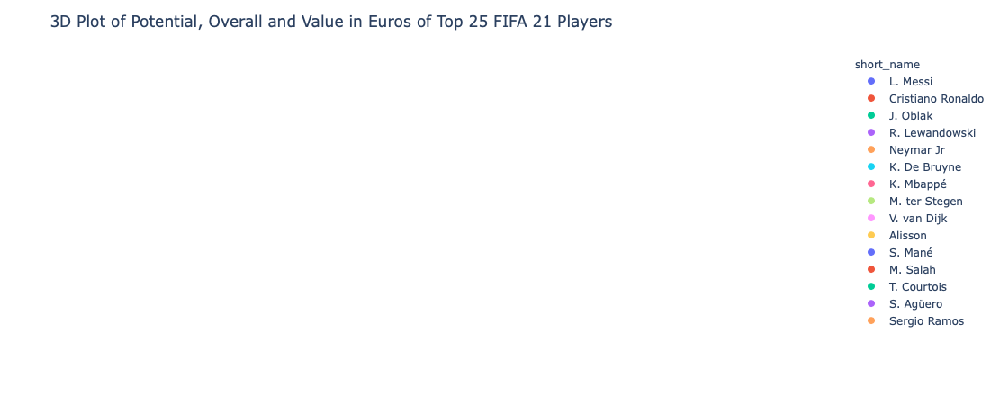

In [28]:
fig = px.scatter_3d(df_21.head(25), x='potential', y='overall', z='value_eur',
              color='short_name')
fig.update_layout(title='3D Plot of Potential, Overall and Value in Euros of Top 25 FIFA 21 Players')
fig.show()